In [2]:
import warnings
import pathlib
from datetime import datetime, timedelta

import numpy as np
import pandas as pd
import xarray as xr

import matplotlib.pyplot as plt
import cartopy.crs as ccrs

import intake
import healpy

In [3]:
tracks_path = pathlib.Path("/scratch/b/b382728/tobac_tracks/")

In [4]:
files_2029 = sorted(list(tracks_path.glob("2029/*.nc")))

In [5]:
tracks = xr.open_dataset(files_2029[0])

In [6]:
tracks

<xarray.Dataset> Size: 609MB
Dimensions:                   (feature: 2491381, track: 156496)
Coordinates:
  * feature                   (feature) int64 20MB 324 357 ... 5427615 5427616
  * track                     (track) int64 1MB 1 2 3 4 ... 170963 170965 170966
Data variables: (12/22)
    frame                     (feature) int64 20MB ...
    idx                       (feature) int64 20MB ...
    y                         (feature) float64 20MB ...
    x                         (feature) float64 20MB ...
    detection_pixel_count     (feature) int64 20MB ...
    threshold_value           (feature) int64 20MB ...
    ...                        ...
    max_precip                (feature) float64 20MB ...
    total_precip              (feature) float64 20MB ...
    cell                      (feature) int64 20MB ...
    time_cell                 (feature) timedelta64[ns] 20MB ...
    time_track                (feature) timedelta64[ns] 20MB ...
    is_track_mcs              (track) bool 156kB ...

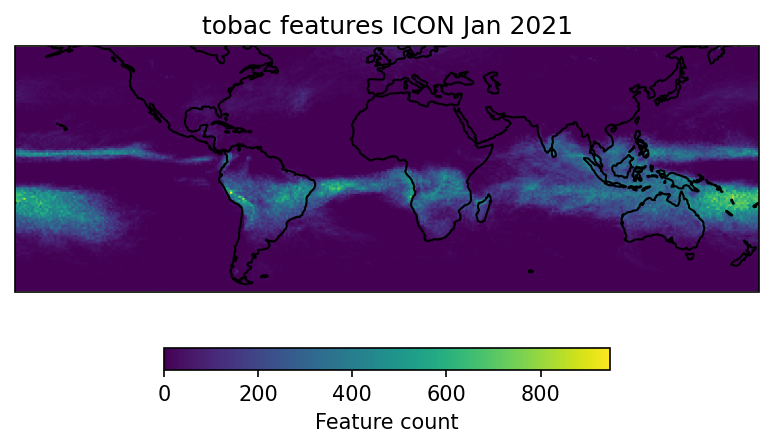

In [7]:
feature_hist = np.histogram2d(
    tracks["latitude"].to_numpy(), 
    tracks["longitude"].to_numpy(), 
    bins=[np.linspace(-60,60,121), np.linspace(0,360,361)]
)[0]

fig, ax = plt.subplots(1, 1, dpi=150, figsize=(6.4, 3.2), subplot_kw=dict(projection=ccrs.PlateCarree()))

img = ax.imshow(feature_hist, extent=[0,360,60,-60])
ax.coastlines()
ax.set_extent([-180,180,59.5,-59.5])
ax.set_title("tobac features ICON Jan 2021")

plt.colorbar(img, label="Feature count", orientation="horizontal", shrink=0.6)

In [8]:
dates = pd.date_range(datetime(2029,1,1), datetime(2033,1,1), freq="ME", inclusive="left").to_pydatetime()

In [9]:
d = dates[0]

In [10]:
d.strftime("%B %Y")

'January 2029'

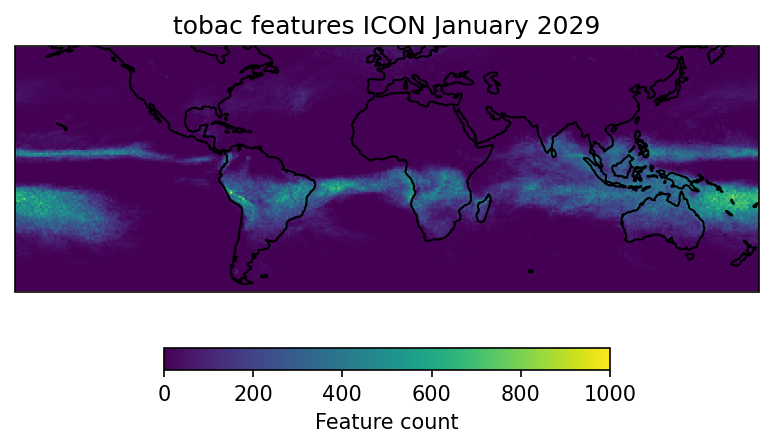

In [11]:
import xarray as xr
import matplotlib.pyplot as plt
from matplotlib import animation

i = 0

tracks = xr.open_dataset(sorted(list(tracks_path.glob(f"{dates[i].strftime('%Y')}/tobac_{dates[i].strftime('%Y%m')}*.nc")))[0])
    
feature_hist = np.histogram2d(
    tracks["latitude"].to_numpy(), 
    tracks["longitude"].to_numpy(), 
    bins=[np.linspace(-60,60,121), np.linspace(0,360,361)]
)[0]

# Step 2: create initial plot
fig, ax = plt.subplots(1, 1, dpi=150, figsize=(6.4, 3.2), subplot_kw=dict(projection=ccrs.PlateCarree()))

img = ax.imshow(feature_hist, extent=[0,360,60,-60], vmin=0, vmax=1000)
ax.coastlines()
ax.set_extent([-180,180,59.5,-59.5])
title = ax.set_title(f"tobac features ICON {dates[i].strftime('%B %Y')}")

plt.colorbar(img, label="Feature count", orientation="horizontal", shrink=0.6)
# Add other fixed elements such as axis labels, title, colorbar here...

# Step 3: define init function

# This is needed for the animation, but if you've already created it in the previous step you only need to return the elements that will be animated:

def init():
    return img, title

# Step 4: define animation update function

# This takes an integer for the frame number and updates the elements returned in init

def animate(i):
    tracks = xr.open_dataset(sorted(list(tracks_path.glob(f"{dates[i].strftime('%Y')}/tobac_{dates[i].strftime('%Y%m')}*.nc")))[0])

    feature_hist = np.histogram2d(
        tracks["latitude"].to_numpy(), 
        tracks["longitude"].to_numpy(), 
        bins=[np.linspace(-60,60,121), np.linspace(0,360,361)]
    )[0]

    img.set_data(np.roll(feature_hist, 180, 1))
    title.set_text(f"tobac features ICON {dates[i].strftime('%B %Y')}")
    return img, title

# Step 5: create animation

anim = animation.FuncAnimation(fig, animate, init_func=init, frames=48, interval=100, blit=True)

# Step 6: render animation



In [12]:
# Embed in browser (e.g. jupyter notebook)
from IPython.display import HTML
jshtml = anim.to_jshtml()
HTML(jshtml)